# Задание 4
В файле ALL_SPB_STOPS.CSV  (из предыдущего задания) содержатся сведения об остановках наземного транспорта Санкт-Петербурга и станций метро (с указанием долготы и широты). Идентификаторы станций метро начинаются с 100***. Выберите окрестность какого-нибудь метро в радиусе около 1000 метров и попытайтесь кластеризовать методом К-средних остановки, попавшие в этот радиус, по координатам. Результат кластеризации продемонстрируйте (явно выпишите названия остановок в кластере или изобразите на карте).

In [32]:
import pandas as pd
import matplotlib
import geopandas as gps
import contextily as ctx
import matplotlib.pyplot as plt


matplotlib.style.use('ggplot')
%matplotlib inline

In [33]:
df = pd.read_csv("ALL_SPB_STOPS.csv", sep=";", header = 0, index_col='ID_STOP')
df.head()

,STOP_NAME,LATITUDE,LONGITUDE
ID_STOP,,,
100101,Пр.Ветеранов-1,59.841604,30.253984
100102,Пр.Ветеранов-2,59.842042,30.250084
100103,Ленинский пр.-1,59.851683,30.268385
100104,Ленинский пр.-2,59.849710,30.268348
100105,Автово,59.867292,30.261133


In [34]:
df.shape

(7154, 3)

In [35]:
df.dtypes

STOP_NAME     object
LATITUDE     float64
LONGITUDE    float64
dtype: object

Выбираем остановку метро, вокруг которой будем искать остановки наземного транспорта

In [36]:
subway_stop = df.loc[(df['STOP_NAME'] == 'Нарвская')]
subway_stop

,STOP_NAME,LATITUDE,LONGITUDE
ID_STOP,,,
100107,Нарвская,59.901064,30.274819


Считаем расстояние от каждой остановки до выбранной станции метро

In [37]:
from geopy import distance

df['DISTANCE'] = df.apply(lambda row: distance.distance(tuple([row.LATITUDE, row.LONGITUDE]),
                                                        tuple([subway_stop.iloc[0][1], subway_stop.iloc[0][2]])).km,axis=1)
df.head()

,STOP_NAME,LATITUDE,LONGITUDE,DISTANCE
ID_STOP,,,,
100101,Пр.Ветеранов-1,59.841604,30.253984,6.726515
100102,Пр.Ветеранов-2,59.842042,30.250084,6.720095
100103,Ленинский пр.-1,59.851683,30.268385,5.513327
100104,Ленинский пр.-2,59.849710,30.268348,5.732900
100105,Автово,59.867292,30.261133,3.839830


Выбираем остановки наземного транспорта в радиусе 1 км

In [38]:
df_bus = df[(df.DISTANCE <= 1) & (df.index // 1000 != 100)].copy()
df_bus.head()

,STOP_NAME,LATITUDE,LONGITUDE,DISTANCE
ID_STOP,,,,
15260,Администрация Кировского района (20),59.894104,30.275499,0.776356
15262,"Метро ""Нарвская"" (20, об/ст)",59.900915,30.274469,0.025699
15264,"Метро ""Нарвская"" (20)",59.900103,30.273903,0.118760
15266,Администрация Кировского района (20),59.894505,30.275101,0.730933
16440,"Комбинат ""Звезда"" Т (41)",59.907134,30.262670,0.958902


Кластеризуем

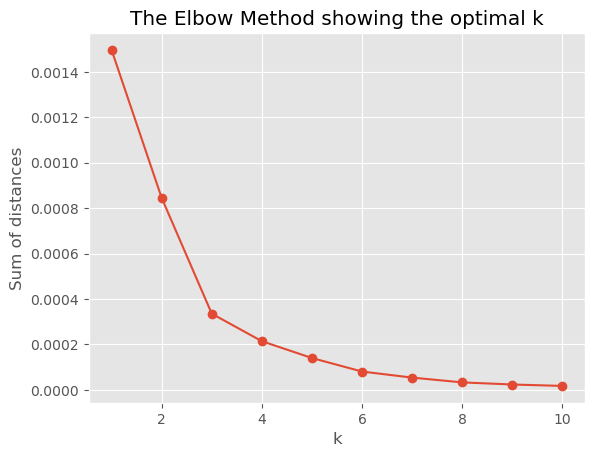

In [40]:
from sklearn.cluster import KMeans

K = range(1, 11)
models = [KMeans(n_clusters=k, random_state=42).fit(df_bus[['LATITUDE', 'LONGITUDE']]) for k in K]
dist = [model.inertia_ for model in models]

plt.plot(K, dist, marker='o')
plt.xlabel('k')
plt.ylabel('Sum of distances')
plt.title('The Elbow Method showing the optimal k')
plt.show()

Возьмем 4 кластера

In [57]:
model = KMeans(n_clusters=4, random_state=42)
model.fit(df_bus[['LATITUDE', 'LONGITUDE']])
df_bus['cluster'] = model.labels_
df_bus.head()

,STOP_NAME,LATITUDE,LONGITUDE,DISTANCE,cluster,geometry
ID_STOP,,,,,,
15260,Администрация Кировского района (20),59.894104,30.275499,0.776356,2,POINT (30.27550 59.89410)
15262,"Метро ""Нарвская"" (20, об/ст)",59.900915,30.274469,0.025699,3,POINT (30.27447 59.90091)
15264,"Метро ""Нарвская"" (20)",59.900103,30.273903,0.118760,3,POINT (30.27390 59.90010)
15266,Администрация Кировского района (20),59.894505,30.275101,0.730933,2,POINT (30.27510 59.89451)
16440,"Комбинат ""Звезда"" Т (41)",59.907134,30.262670,0.958902,0,POINT (30.26267 59.90713)


In [58]:
df_bus.groupby('cluster').size()

cluster
0     4
1    13
2     4
3     7
dtype: int64

In [59]:
for i in range(df_bus.cluster.nunique()):
    print(f'{i + 1}-й кластер:')
    print(df_bus[df_bus.cluster == i].STOP_NAME)
    print()

1-й кластер:
ID_STOP
16440                Комбинат "Звезда" Т (41)
16444               Парк "Екатерингоф" Т (41)
16478               Парк "Екатерингоф" Т (41)
1662     ЛИФЛЯНДСКАЯ УЛ. [49, 65, 66, 70, 71]
Name: STOP_NAME, dtype: object

2-й кластер:
ID_STOP
1706           НАБ. ОБВОДНОГО КАНАЛА,138 [65, 70, 71]
1707       НАБ. ОБВОДНОГО КАНАЛА,150 [65, 71, 49, 66]
1713                          НАРВСКИЙ ПР. [2, 6, 66]
2114             СТАРО-ПЕТЕРГОФСКИЙ ПР.,27 [2, 6, 66]
24743                               Нарвский проспект
24744                               Нарвский проспект
2904          НАБ. ОБВОДНОГО КАНАЛА,138 [65, 70, 71]<
2909                         НАРВСКИЙ ПР. [2, 6, 66]<
3302     СТАРО-ПЕТЕРГОФСКИЙ ПР. [65, 70, 70, 71, 49]<
3303            СТАРО-ПЕТЕРГОФСКИЙ ПР.,27 [2, 6, 66]<
4515                     НАБ. ОБВОДНОГО КАНАЛА (тест)
4769                СТАРОПЕТЕРГОФСКИЙ ПР. [65] (тест)
4775               СТАРОПЕТЕРГОФСКИЙ ПР. [65]< (тест)
Name: STOP_NAME, dtype: object

3-й клас

Нарисуем кластеры на карте

In [60]:
sh = gps.read_file("Regions.shx")
spb = sh.loc[sh['NAME'] == 'Санкт-Петербург']
spb = spb.to_crs(epsg=3857)

In [61]:
from shapely.geometry import Point
from geopandas import GeoDataFrame

geometry = [Point(xy) for xy in zip(df_bus['LONGITUDE'], df_bus['LATITUDE'])]
gdf = GeoDataFrame(df_bus, geometry=geometry)
gdf.head()

,STOP_NAME,LATITUDE,LONGITUDE,DISTANCE,cluster,geometry
ID_STOP,,,,,,
15260,Администрация Кировского района (20),59.894104,30.275499,0.776356,2,POINT (30.27550 59.89410)
15262,"Метро ""Нарвская"" (20, об/ст)",59.900915,30.274469,0.025699,3,POINT (30.27447 59.90091)
15264,"Метро ""Нарвская"" (20)",59.900103,30.273903,0.118760,3,POINT (30.27390 59.90010)
15266,Администрация Кировского района (20),59.894505,30.275101,0.730933,2,POINT (30.27510 59.89451)
16440,"Комбинат ""Звезда"" Т (41)",59.907134,30.262670,0.958902,0,POINT (30.26267 59.90713)


In [62]:
gdf.set_crs(epsg=4326, inplace=True)
gdf = gdf.to_crs(spb.crs)

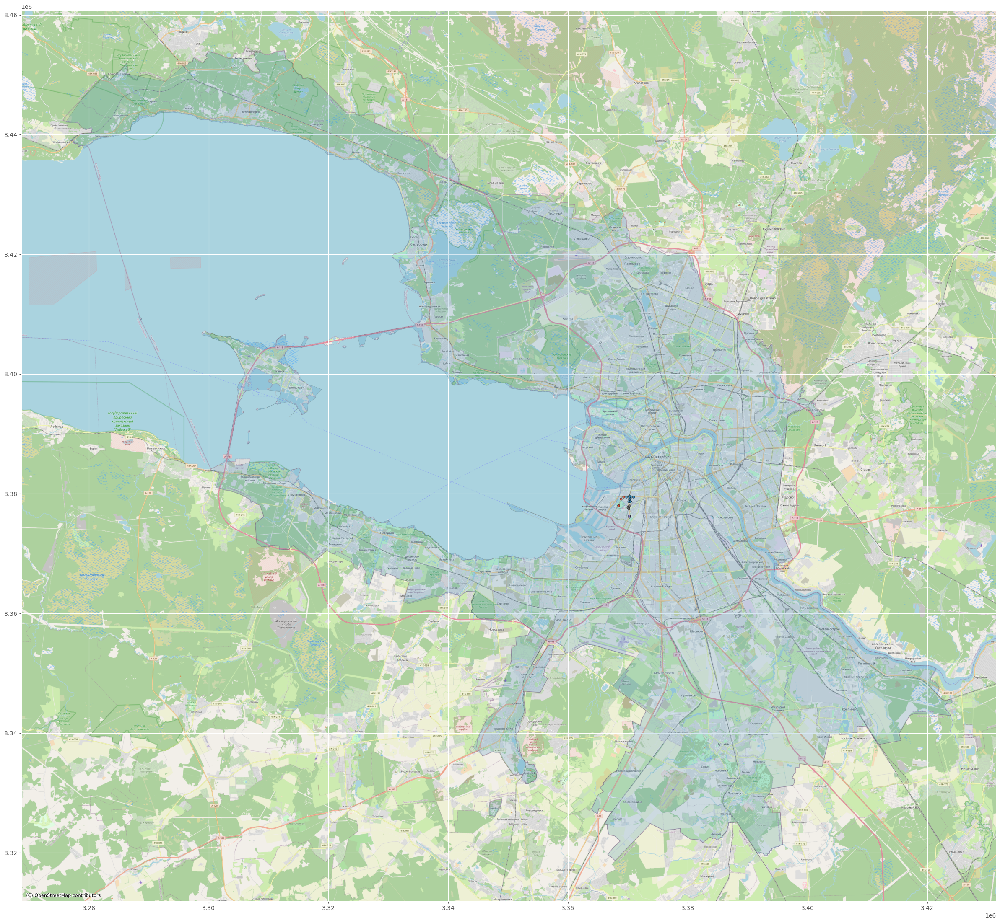

In [63]:
base = spb.plot(alpha=0.2, edgecolor='black', figsize=(30, 30))
gdf.groupby('cluster').plot(ax=base, marker='o', markersize=15, alpha=0.75, edgecolor='black')
ctx.add_basemap(base, zoom=12, source=ctx.providers.OpenStreetMap.Mapnik)

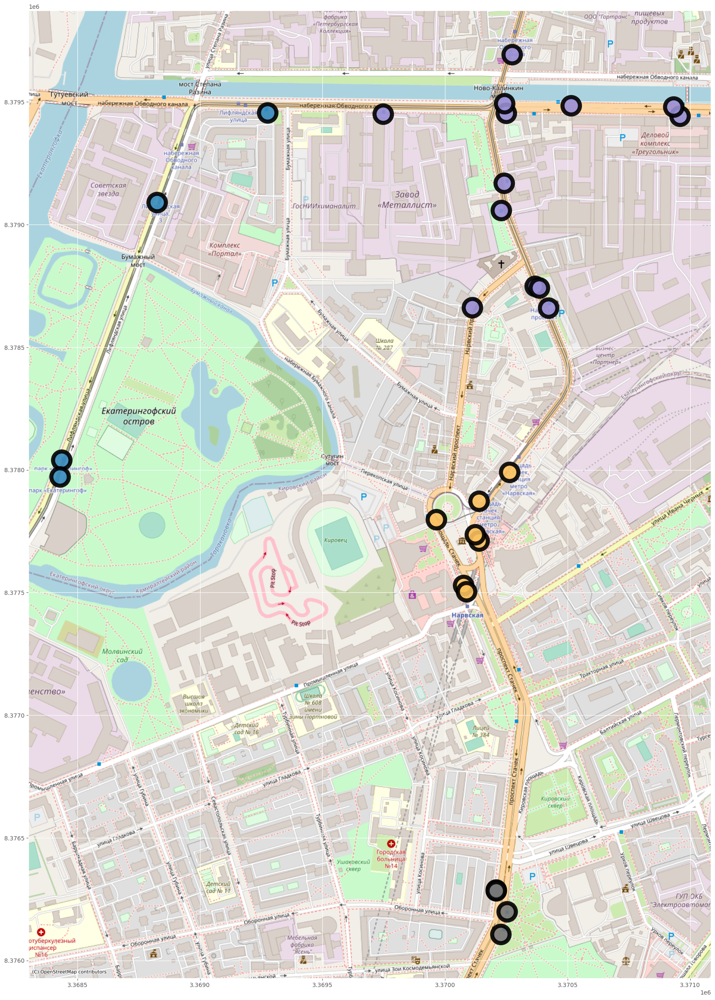

In [64]:
base = gdf.plot(alpha=0, edgecolor='black', figsize=(30, 30))
gdf.groupby('cluster').plot(ax=base, marker='o', markersize=900, edgecolor='black', linewidths=7, alpha=0.9);
ctx.add_basemap(base, source=ctx.providers.OpenStreetMap.Mapnik)